In [1]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import scipy.sparse as sp
import scipy.cluster.hierarchy as sch
import plotly.figure_factory as ff

In [2]:
def spectral(G,k = 2):
    #  matrix for computation
    n = len(G.nodes())
    A = nx.to_scipy_sparse_matrix(G)
    deg = sp.csr_matrix.dot(A, np.ones(n))
    D = sp.diags(deg)
    L = D - A
    
    # Spectral decomposition
    lam,V = sp.linalg.eigsh(L, min(k,n - 1), sigma = -1)
    index = np.argsort(lam)
    lam,V = lam[index],V[:,index]

    return sch.linkage(V,method =  'single')

In [3]:
def plot_best_clusterings(G, D, k, pos, width = 16, height = 8):
    nb_plot = 2
    k1 = min(k,nb_plot)
    k2 = max(1,k // nb_plot)
    colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', '0.5','0.3','0.8', '0.6','0.2','0.7','0.1','0.9']
    plt.rcParams.update({'font.size': 24})
    plt.figure(figsize=(k1 * width, k2 * height))
    plt.subplots_adjust(left=.02, right=.98, bottom=.06, top=.85, wspace=.05, hspace=.05)
    for i in range(k):
        clustering = best_clustering(D, i)
        length = [len(c) for c in clustering]
        index = np.argsort(-np.array(length))

        plt.subplot(k2, k1, i + 1)
        plt.axis('off')
        plt.title("Rank: " + str(i + 1) + "\n(#clusters=" + str(len(clustering)) + ")")
        draw_nodes = nx.draw_networkx_nodes(G, pos, node_size=50, node_color='w')
        draw_nodes.set_edgecolor('k')
        nx.draw_networkx_edges(G, pos, alpha=.1)
        nodes = list(G.nodes())
        for l in range(min(len(clustering),len(colors))):
            nodelist = [nodes[i] for i in clustering[index[l]]]
            draw_nodes = nx.draw_networkx_nodes(G, pos, node_size=50, nodelist = nodelist,node_color=colors[l])
            draw_nodes.set_edgecolor('k')
    plt.show()

In [4]:
# Select the k-th best clustering
def best_clustering(D, k = 0):
    return select_clustering(D, rank_clustering(D)[k])

# Select the clustering after k merges

In [5]:
# Select the clustering after k merges
def select_clustering(D, k):
    n = np.shape(D)[0] + 1
    k = min(k,n - 1)
    cluster = {i:[i] for i in range(n)}
    for t in range(k):
        cluster[n + t] = cluster.pop(int(D[t][0])) + cluster.pop(int(D[t][1]))
    return sorted(cluster.values(), key = len, reverse = True)


In [6]:
# Rank clusterings at every level of the dendrogram
def rank_clustering(D):
    logdist = np.log(D[:,2])
    delta = logdist[1:] - logdist[:-1]
    return np.argsort(-delta[len(delta)//2:]) + 1 + len(delta)//2


In [7]:
G = nx.read_graphml("C:/Users/amin/Downloads/project computational and pattern/hierarchical/openstreet.graphml", node_type = int)
print(nx.info(G))

Name: Openstreet
Type: Graph
Number of nodes: 5993
Number of edges: 6958
Average degree:   2.3220


In [8]:
D=spectral(G)

In [9]:
pos_x = nx.get_node_attributes(G,'pos_x')
pos_y = nx.get_node_attributes(G,'pos_y')
pos = {u: (pos_x[u], pos_y[u]) for u in G.nodes()}

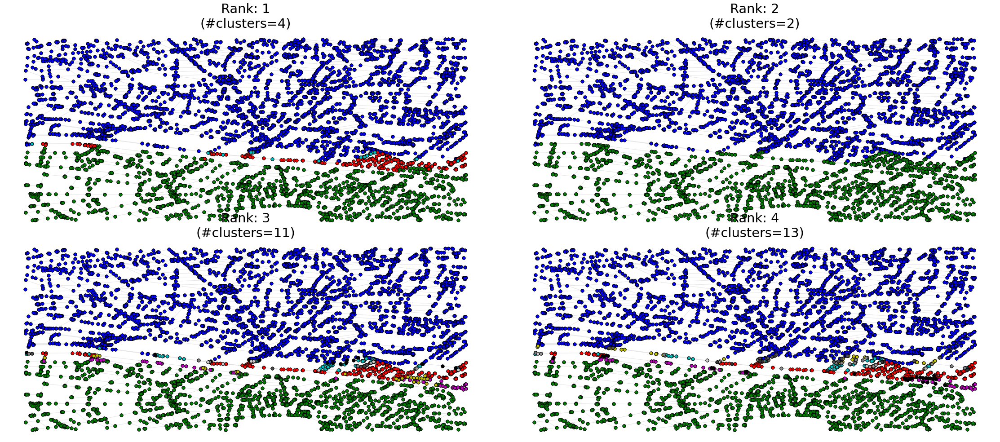

In [10]:
plot_best_clusterings(G, D, 4, pos)

In [11]:
fig = ff.create_dendrogram(D)
fig.update_layout(width=800, height=500)
fig.show()

In [12]:
fig = ff.create_dendrogram(D, orientation='left')
fig.update_layout(width=800, height=800)
fig.show()